In [22]:
from sklearn.datasets import make_classification
import numpy as np
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=10)

In [23]:
import matplotlib.pyplot as plt

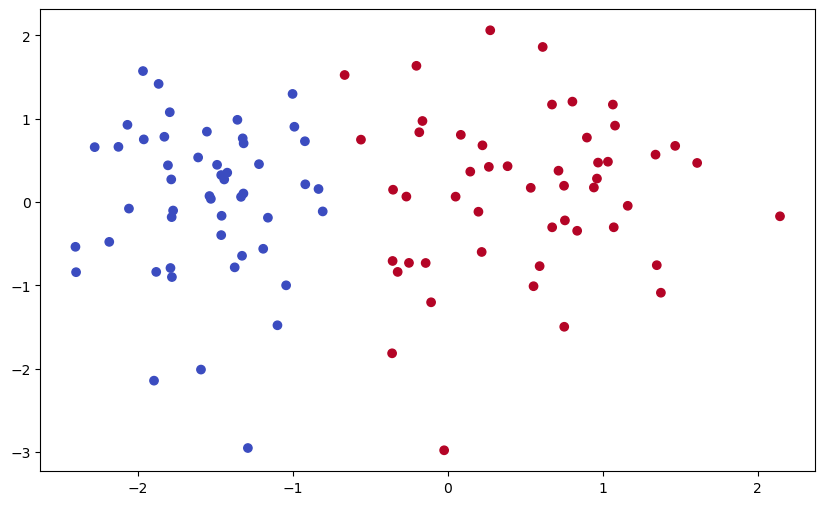

In [24]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm')

In [25]:
def step(z):
    return 1 if z>0 else 0

def perceptron(X,y):
    
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    m=[]
    c=[]
    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        m.append(-weights[1]/weights[2])
        c.append(-weights[0]/weights[2])
        
    return weights[0],weights[1:],m,c

In [26]:
intercept_,coef_,m,c = perceptron(X,y)
print(coef_)
print(intercept_)

[1.38044339 0.17657887]
0.9


In [27]:
m = np.array(m).reshape(-1, 1)
c = np.array(c).reshape(-1, 1)

In [28]:
m

array([[-1.        ],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.06844214],
       [-1.39423337],
       [-1.39423337],
       [-1.39423337],
       [-1.69554652],
       [-1.69554652],
       [-1.69554652],
       [-1.69554652],
       [-1.69554652],
       [-1.69554652],
       [-1.69554652],
       [-1.69554652],
       [-1.69554652],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2.0278958 ],
       [-2

In [29]:
m_f = -(coef_[0]/coef_[1])
c_f = -(intercept_/coef_[1])

In [30]:
m_f

-7.81771544463498

In [31]:
x_input = np.linspace(-3,3,100)
y_input = m_f*x_input + c_f

(-3.0, 2.0)

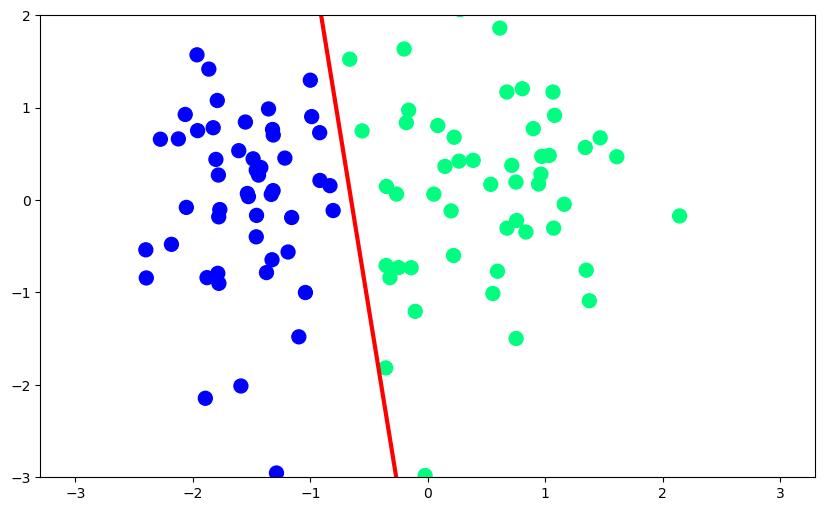

In [32]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

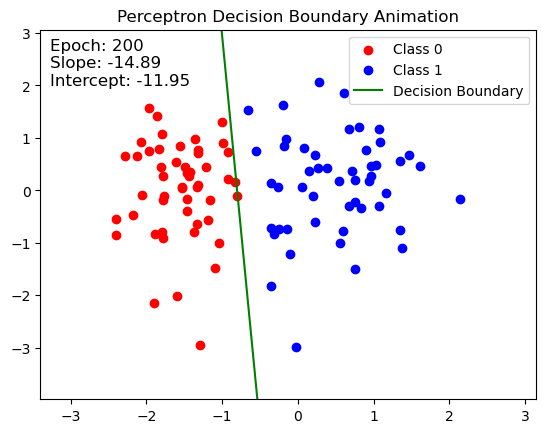

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Define the step function
def step(z):
    return 1 if z > 0 else 0

# Define the perceptron function with animation
def perceptron_with_animation(X, y):
    X = np.insert(X, 0, 1, axis=1)  # Add bias term to input
    weights = np.ones(X.shape[1])  # Initialize weights
    lr = 0.1  # Learning rate
    m = []  # Slopes of decision boundary
    c = []  # Intercepts of decision boundary

    # Plot setup
    fig, ax = plt.subplots()
    ax.scatter(X[:, 1][y == 0], X[:, 2][y == 0], color='red', label='Class 0')
    ax.scatter(X[:, 1][y == 1], X[:, 2][y == 1], color='blue', label='Class 1')
    line, = ax.plot([], [], 'g-', label='Decision Boundary')
    ax.legend()
    ax.set_xlim(X[:, 1].min() - 1, X[:, 1].max() + 1)
    ax.set_ylim(X[:, 2].min() - 1, X[:, 2].max() + 1)
    ax.set_title('Perceptron Decision Boundary Animation')
    # Text to display frame number and slope
    text = ax.text(0.02, 0.85, '', transform=ax.transAxes, fontsize=12, color='black')

    # Update function for animation
    def update(frame):
        nonlocal weights  # Access weights from the outer scope
        j = np.random.randint(0, len(X))
        y_hat = step(np.dot(X[j], weights))
        weights = weights + lr * (y[j] - y_hat) * X[j]

        # Calculate slope and intercept
        if weights[2] != 0:  # Avoid division by zero
            slope = -weights[1] / weights[2]
            intercept = -weights[0] / weights[2]
        else:
            slope, intercept = 0, 0

        m.append(slope)
        c.append(intercept)
        

        # Update line data
        x_vals = np.array(ax.get_xlim())
        y_vals = slope * x_vals + intercept
        line.set_data(x_vals, y_vals)
        text.set_text(f'Epoch: {frame + 1}\nSlope: {slope:.2f}\nIntercept: {intercept:.2f}')

        return line,text

    # Create animation
    ani = FuncAnimation(fig, update, frames=200, interval=100, blit=True)

    # Return the animation
    return ani

# Example dataset
'''np.random.seed(0)
X = np.random.rand(100, 2) * 10  # Random 2D points
y = (X[:, 0] + X[:, 1] > 10).astype(int)  # Simple linear separation'''

# Run the perceptron with animation
ani = perceptron_with_animation(X, y)

# Display animation in Jupyter
HTML(ani.to_jshtml())
